Instructions

**Part1: supervised learning**

- Import you data and perform basic data exploration phase
- Display general information about the dataset
- Create a pandas profiling reports to gain insights into the dataset
- Handle Missing and corrupted values
- Remove duplicates, if they exist
- Handle outliers, if they exist
- Encode categorical features
- Prepare your dataset for the modelling phase
- Apply Decision tree, and plot its ROC curve
- Try to improve your model performance by changing the model hyperparameters

**Part2: unsupervised learning**

- Drop out the target variable
- Apply K means clustering and plot the clusters
- Find the optimal K parameter
- Interpret the results

In [65]:
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, r2_score, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from ydata_profiling import ProfileReport
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

In [2]:
df = pd.read_csv(r'C:\Users\Hp\Desktop\dataset\Machine learning\Microsoft_malware_dataset_min.csv')

In [3]:
df.head()

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_OSEdition,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,OsPlatformSubRelease,CountryIdentifier
0,0,0.0,0.0,Professional,0,1.0,0.0,1.0,rs4,29
1,0,0.0,0.0,Professional,0,1.0,0.0,1.0,rs4,93
2,0,0.0,0.0,Core,0,1.0,0.0,1.0,rs4,86
3,1,0.0,0.0,Professional,0,1.0,0.0,1.0,rs4,88
4,1,0.0,0.0,Core,0,1.0,0.0,1.0,rs4,18


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   HasDetections               100000 non-null  int64  
 1   Wdft_IsGamer                96585 non-null   float64
 2   Census_IsVirtualDevice      99815 non-null   float64
 3   Census_OSEdition            100000 non-null  object 
 4   Census_HasOpticalDiskDrive  100000 non-null  int64  
 5   Firewall                    98924 non-null   float64
 6   SMode                       94068 non-null   float64
 7   IsProtected                 99609 non-null   float64
 8   OsPlatformSubRelease        100000 non-null  object 
 9   CountryIdentifier           100000 non-null  int64  
dtypes: float64(5), int64(3), object(2)
memory usage: 7.6+ MB


In [5]:
df.isnull().sum()

HasDetections                    0
Wdft_IsGamer                  3415
Census_IsVirtualDevice         185
Census_OSEdition                 0
Census_HasOpticalDiskDrive       0
Firewall                      1076
SMode                         5932
IsProtected                    391
OsPlatformSubRelease             0
CountryIdentifier                0
dtype: int64

In [6]:
#firewll relation  with Census_OSEdition : 1 if win 8 or abouve 0 else 

In [7]:
print(df['Wdft_IsGamer'].unique())
print(df['Census_IsVirtualDevice'].unique())
print(df['Firewall'].unique())
print(df['SMode'].unique())
print(df['IsProtected'].unique())

print(df['OsPlatformSubRelease'].unique())
print(df['Census_OSEdition'].unique())



[ 0.  1. nan]
[ 0. nan  1.]
[ 1.  0. nan]
[ 0. nan  1.]
[ 1.  0. nan]
['rs4' 'rs1' 'rs3' 'windows7' 'windows8.1' 'th1' 'rs2' 'th2' 'prers5']
['Professional' 'Core' 'CoreSingleLanguage' 'EnterpriseS'
 'CoreCountrySpecific' 'EnterpriseSN' 'ProfessionalEducation' 'Enterprise'
 'Education' 'Cloud' 'ProfessionalN' 'ServerStandard' 'CoreN'
 'ServerStandardEval' 'EducationN' 'ServerDatacenterEval'
 'ProfessionalEducationN' 'ServerSolution' 'EnterpriseN']


In [8]:
df_Census_OSEdition = df.groupby(by=['Census_OSEdition']).count()
df_Census_OSEdition = pd.DataFrame(df_Census_OSEdition)
df_Census_OSEdition

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,OsPlatformSubRelease,CountryIdentifier
Census_OSEdition,,,,,,,,,
Cloud,64,60,62,64,63,62,64,64,64
Core,38727,37609,38669,38727,38178,36500,38633,38727,38727
CoreCountrySpecific,1862,1789,1861,1862,1854,1699,1862,1862,1862
CoreN,56,49,56,56,56,53,55,56,56
CoreSingleLanguage,21886,21283,21839,21886,21835,20186,21782,21886,21886
Education,442,431,442,442,442,422,442,442,442
EducationN,11,11,11,11,11,11,11,11,11
Enterprise,404,395,404,404,403,394,401,404,404
EnterpriseN,5,5,5,5,5,5,5,5,5


In [9]:
df_Wdft_IsGamer = df[df['Wdft_IsGamer'].isnull()]
df_Wdft_IsGamer.head()

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_OSEdition,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,OsPlatformSubRelease,CountryIdentifier
64,0,NaN,0.0,CoreCountrySpecific,0,1.0,NaN,1.0,rs3,43
91,0,NaN,0.0,Core,0,1.0,0.0,1.0,rs2,171
109,1,NaN,0.0,CoreSingleLanguage,0,1.0,0.0,1.0,rs4,201
116,0,NaN,0.0,Professional,0,1.0,0.0,1.0,rs4,27
162,0,NaN,0.0,Professional,0,1.0,0.0,1.0,rs2,56


In [10]:
group_by = df_Wdft_IsGamer.groupby(by=['Firewall'])['Wdft_IsGamer'].count()
group_by = group_by.reset_index()
group_by


,Firewall,Wdft_IsGamer
0,0.0,0
1,1.0,0


In [11]:
df_Wdft_IsGamer.head(50)

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_OSEdition,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,OsPlatformSubRelease,CountryIdentifier
64,0,NaN,0.0,CoreCountrySpecific,0,1.0,NaN,1.0,rs3,43
91,0,NaN,0.0,Core,0,1.0,0.0,1.0,rs2,171
109,1,NaN,0.0,CoreSingleLanguage,0,1.0,0.0,1.0,rs4,201
116,0,NaN,0.0,Professional,0,1.0,0.0,1.0,rs4,27
162,0,NaN,0.0,Professional,0,1.0,0.0,1.0,rs2,56
174,1,NaN,0.0,Core,0,1.0,0.0,1.0,rs4,59
191,0,NaN,0.0,Core,0,1.0,0.0,1.0,rs4,122
260,1,NaN,0.0,CoreSingleLanguage,0,1.0,0.0,1.0,rs3,142
264,1,NaN,0.0,Core,0,1.0,0.0,1.0,rs3,107
275,1,NaN,0.0,CoreSingleLanguage,0,1.0,0.0,1.0,rs3,141


In [12]:
df1 = df.dropna().reset_index(drop=True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89447 entries, 0 to 89446
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   HasDetections               89447 non-null  int64  
 1   Wdft_IsGamer                89447 non-null  float64
 2   Census_IsVirtualDevice      89447 non-null  float64
 3   Census_OSEdition            89447 non-null  object 
 4   Census_HasOpticalDiskDrive  89447 non-null  int64  
 5   Firewall                    89447 non-null  float64
 6   SMode                       89447 non-null  float64
 7   IsProtected                 89447 non-null  float64
 8   OsPlatformSubRelease        89447 non-null  object 
 9   CountryIdentifier           89447 non-null  int64  
dtypes: float64(5), int64(3), object(2)
memory usage: 6.8+ MB


In [13]:
df1['SMode'] = df1['SMode'].astype(int)
df1['Census_IsVirtualDevice'] = df1['Census_IsVirtualDevice'].astype(int)
df1['Firewall'] = df1['Firewall'].astype(int)
df1['SMode'] = df1['SMode'].astype(int)
df1['IsProtected'] = df1['IsProtected'].astype(int)

In [14]:
df1

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_OSEdition,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,OsPlatformSubRelease,CountryIdentifier
0,0,0.0,0,Professional,0,1,0,1,rs4,29
1,0,0.0,0,Professional,0,1,0,1,rs4,93
2,0,0.0,0,Core,0,1,0,1,rs4,86
3,1,0.0,0,Professional,0,1,0,1,rs4,88
4,1,0.0,0,Core,0,1,0,1,rs4,18
...,...,...,...,...,...,...,...,...,...,...
89442,1,0.0,0,Professional,0,1,0,1,rs3,177
89443,0,0.0,0,Core,0,1,0,1,th1,177
89444,1,0.0,0,Professional,1,1,0,1,rs4,206
89445,0,0.0,0,Professional,0,1,0,1,rs3,93


In [15]:
le = LabelEncoder()
df1['Census_OSEdition_numeric'] = le.fit_transform(df1['Census_OSEdition'])
df1['OsPlatformSubRelease_numeric'] = le.fit_transform(df1['OsPlatformSubRelease'])


In [16]:
df_old_new_Census = df1[['Census_OSEdition', 'Census_OSEdition_numeric']]
df_old_new_Census.groupby(by=['Census_OSEdition']).count()

,Census_OSEdition_numeric
Census_OSEdition,
Cloud,56
Core,34848
CoreCountrySpecific,1634
CoreN,45
CoreSingleLanguage,19472
Education,412
EducationN,11
Enterprise,382
EnterpriseN,5


In [17]:
osplatformSubR = df1[['OsPlatformSubRelease', 'OsPlatformSubRelease_numeric']]
osplatformSubR.groupby(by=['OsPlatformSubRelease']).count()


,OsPlatformSubRelease_numeric
OsPlatformSubRelease,
prers5,202
rs1,7012
rs2,7505
rs3,25748
rs4,40138
th1,2823
th2,3909
windows7,156
windows8.1,1954


In [18]:
df1.drop(columns=['Census_OSEdition', 'OsPlatformSubRelease'], inplace=True)
df1

,HasDetections,Wdft_IsGamer,Census_IsVirtualDevice,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,CountryIdentifier,Census_OSEdition_numeric,OsPlatformSubRelease_numeric
0,0,0.0,0,0,1,0,1,29,11,4
1,0,0.0,0,0,1,0,1,93,11,4
2,0,0.0,0,0,1,0,1,86,1,4
3,1,0.0,0,0,1,0,1,88,11,4
4,1,0.0,0,0,1,0,1,18,1,4
...,...,...,...,...,...,...,...,...,...,...
89442,1,0.0,0,0,1,0,1,177,11,3
89443,0,0.0,0,0,1,0,1,177,1,5
89444,1,0.0,0,1,1,0,1,206,11,4
89445,0,0.0,0,0,1,0,1,93,11,3


In [19]:
rows, cols = 4, 3
make_plot = make_subplots(rows=rows, cols=cols)
for i, column in enumerate(df1.columns):
    row = (i//cols)+1
    col = (i%cols)+1
    make_plot.add_trace(go.Box(y=df1[column], name= column), row=row, col=col)
make_plot.update_layout(showlegend = False, height = 800, width = 1700 )

make_plot.show()

<Axes: >

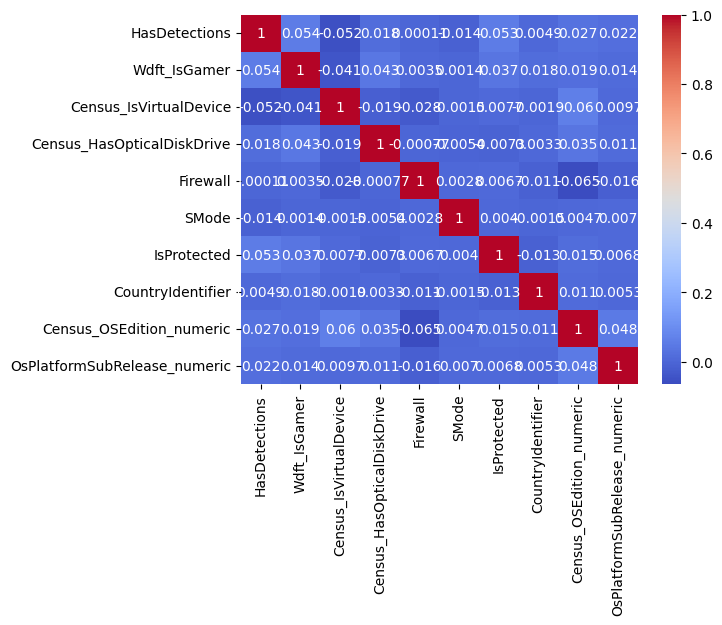

In [20]:
# HeatMap : 
#Heatmap to check correlations 
numerical_values_df = df1.select_dtypes(exclude='object')
corr_heatmap = sns.heatmap(numerical_values_df.corr(), annot=True, cmap='coolwarm')
corr_heatmap

In [21]:
#pandas profiling :
profil_report_pandas = ProfileReport(df1, explorative=True, title='Microsoft_malware_dataset_min')
profil_report_pandas.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89447 entries, 0 to 89446
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   HasDetections                 89447 non-null  int64  
 1   Wdft_IsGamer                  89447 non-null  float64
 2   Census_IsVirtualDevice        89447 non-null  int64  
 3   Census_HasOpticalDiskDrive    89447 non-null  int64  
 4   Firewall                      89447 non-null  int64  
 5   SMode                         89447 non-null  int64  
 6   IsProtected                   89447 non-null  int64  
 7   CountryIdentifier             89447 non-null  int64  
 8   Census_OSEdition_numeric      89447 non-null  int64  
 9   OsPlatformSubRelease_numeric  89447 non-null  int64  
dtypes: float64(1), int64(9)
memory usage: 6.8 MB


In [23]:
# Training, testing, spliting :
X = df1.drop(columns=['HasDetections'])
y = df1['HasDetections']
X_train, X_test, y_train, y_test = train_test_split (X,y, test_size=0.2, random_state=42)
X_test.shape, X_train.shape, y_test.shape, y_train.shape

((17890, 9), (71557, 9), (17890,), (71557,))

**Classification:**

**Random Forest Classifier**

In [24]:
random_classifier = RandomForestClassifier(n_estimators=100, random_state=42) 
random_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [25]:
# prediction
y_pred = random_classifier.predict(X_test)
y_pred

array([0, 0, 0, ..., 1, 0, 1])

In [26]:
# Evaluate the model 
accuracy = accuracy_score(y_test, y_pred) 
conf_matrix = confusion_matrix(y_test, y_pred) 
class_report = classification_report(y_test, y_pred) 
# Display the results 
print(f"Accuracy: {accuracy}") 
print("Confusion Matrix:") 
print(conf_matrix) 
print("Classification Report:") 
print(class_report)

Accuracy: 0.5357741755170486
Confusion Matrix:
[[4492 4318]
 [3987 5093]]
Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.51      0.52      8810
           1       0.54      0.56      0.55      9080

    accuracy                           0.54     17890
   macro avg       0.54      0.54      0.54     17890
weighted avg       0.54      0.54      0.54     17890



<Axes: >

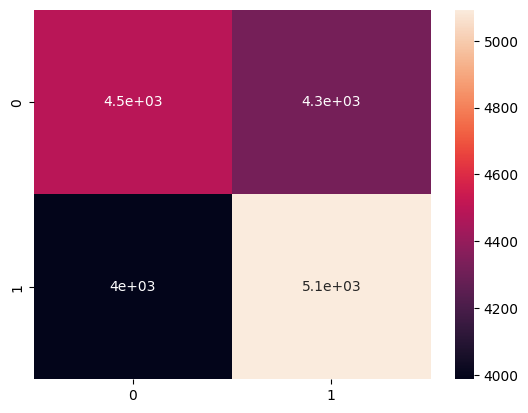

In [27]:
sns.heatmap(conf_matrix, annot=True)

**Logistic Regression**

In [28]:
logistci_reg = LogisticRegression(random_state=42, max_iter=1000)
logistci_reg.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [29]:
# predictions
y_pred_lr = logistci_reg.predict(X_test)
y_pred_lr


array([0, 0, 0, ..., 1, 1, 0])

In [30]:
# Evaluate the model
accuracy_lr = accuracy_score(y_test, y_pred_lr)
confusion_matrix_lr = confusion_matrix(y_test, y_pred_lr)
print(f"Logistic Regression Accuracy: {accuracy_lr:.2f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lr))
print("Classification Report:\n", classification_report(y_test, y_pred_lr))


Logistic Regression Accuracy: 0.53
Confusion Matrix:
 [[4256 4554]
 [3795 5285]]
Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.48      0.50      8810
           1       0.54      0.58      0.56      9080

    accuracy                           0.53     17890
   macro avg       0.53      0.53      0.53     17890
weighted avg       0.53      0.53      0.53     17890



<Axes: >

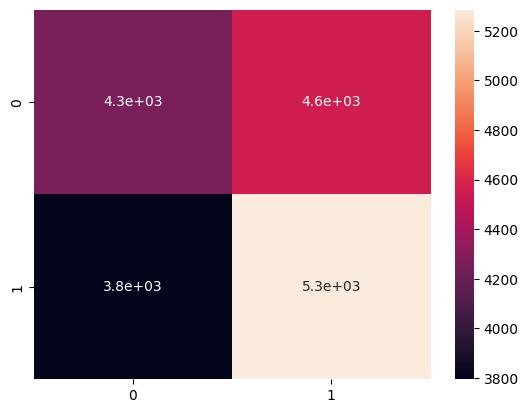

In [31]:
sns.heatmap(confusion_matrix_lr, annot=True)

**Support Vector Machine (SVM)**

In [32]:
# Initialize and train the Support Vector Machine model
clf_svm = SVC(kernel='linear', random_state=42)
clf_svm.fit(X_train, y_train)

SVC(kernel='linear', random_state=42)

In [33]:
# Predictions
y_pred_svm = clf_svm.predict(X_test)
y_pred_svm

array([0, 0, 0, ..., 1, 0, 0])

In [34]:
# Evaluate the model
accuracy_svm = accuracy_score(y_test, y_pred_svm)
confision_matrix_svm = confusion_matrix(y_test,y_pred_svm)
print(f"SVM Accuracy: {accuracy_svm:.2f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_svm))
print("Classification Report:\n", classification_report(y_test, y_pred_svm))

SVM Accuracy: 0.52
Confusion Matrix:
 [[6503 2307]
 [6209 2871]]
Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.74      0.60      8810
           1       0.55      0.32      0.40      9080

    accuracy                           0.52     17890
   macro avg       0.53      0.53      0.50     17890
weighted avg       0.53      0.52      0.50     17890



<Axes: >

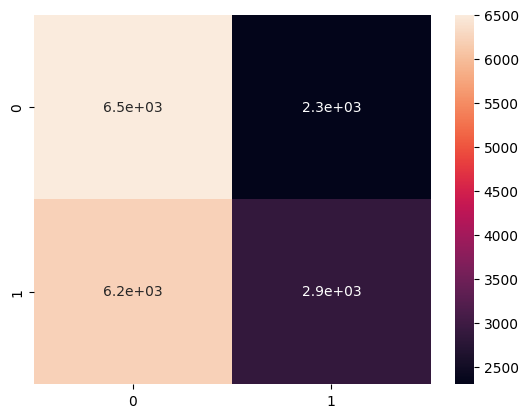

In [35]:
sns.heatmap(confision_matrix_svm, annot=True)

**KNN**

In [36]:
# Initialize and train the k-Nearest Neighbors model
clf_knn = KNeighborsClassifier(n_neighbors=5)
clf_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [37]:
# Make predictions
y_pred_knn = clf_knn.predict(X_test)
y_pred_knn

array([1, 0, 1, ..., 0, 0, 1])

In [38]:
# Evaluate the model
accuracy_knn = accuracy_score(y_test, y_pred_knn)
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
print(f"k-NN Accuracy: {accuracy_knn:.2f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn))
print("Classification Report:\n", classification_report(y_test, y_pred_knn))


k-NN Accuracy: 0.52
Confusion Matrix:
 [[4518 4292]
 [4312 4768]]
Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.51      0.51      8810
           1       0.53      0.53      0.53      9080

    accuracy                           0.52     17890
   macro avg       0.52      0.52      0.52     17890
weighted avg       0.52      0.52      0.52     17890



<Axes: >

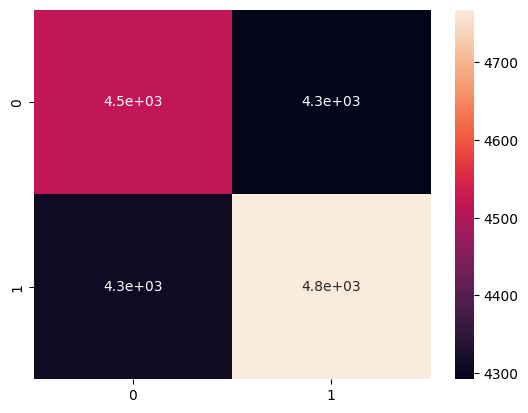

In [39]:
sns.heatmap(conf_matrix_knn, annot=True)

imbalanced data in class 0 

In [40]:
# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

c:\Users\Hp\Desktop\dataset\.venv\lib\site-packages\sklearn\base.py:474: FutureWarning:

`BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.

c:\Users\Hp\Desktop\dataset\.venv\lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning:

The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.



In [41]:
# Initialize and train the k-Nearest Neighbors model
clf_knn = KNeighborsClassifier(n_neighbors=5)
clf_knn.fit(X_train_res, y_train_res)

KNeighborsClassifier()

In [42]:
# Make predictions
y_pred_knn_res = clf_knn.predict(X_test)
y_pred_knn_res

array([0, 0, 1, ..., 0, 0, 1])

In [43]:
# Evaluate the model
accuracy_knn_res = accuracy_score(y_test, y_pred_knn_res)
confusion_matrix_res = confusion_matrix(y_test, y_pred_knn_res)
print(f"k-NN Accuracy: {accuracy_knn_res:.2f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn_res))
print("Classification Report:\n", classification_report(y_test, y_pred_knn_res))


k-NN Accuracy: 0.52
Confusion Matrix:
 [[4376 4434]
 [4136 4944]]
Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.50      0.51      8810
           1       0.53      0.54      0.54      9080

    accuracy                           0.52     17890
   macro avg       0.52      0.52      0.52     17890
weighted avg       0.52      0.52      0.52     17890



<Axes: >

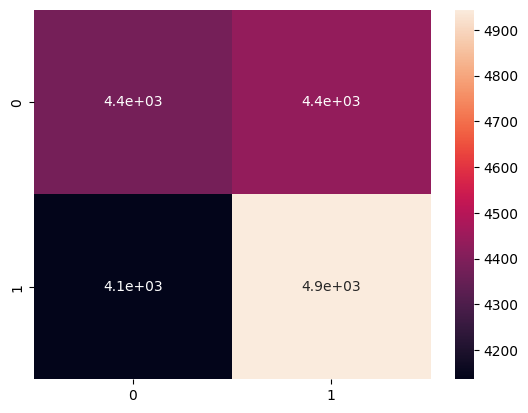

In [44]:
sns.heatmap(confusion_matrix_res, annot=True)

**Use GridSearchCV or RandomizedSearchCV to find the optimal hyperparameters for model**

In [45]:
param_grid = { 'n_estimators': [100, 200, 300],
               'max_depth': [10, 20, 30],
               'min_samples_split': [2, 5, 10],
               'min_samples_leaf': [1, 2, 4] }

In [46]:
# random forest classifier :
classifier_random_forrest = RandomForestClassifier(class_weight='balanced', 
                                                   random_state=42)
grid_search = GridSearchCV(estimator=classifier_random_forrest, 
                           param_grid=param_grid, 
                           cv=3, 
                           n_jobs=-1, 
                           verbose=2) 
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 81 candidates, totalling 243 fits


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [47]:
# Get the best estimator 
best_classifier_random_forrest = grid_search.best_estimator_ 

In [48]:
# Make predictions 
y_pred_rf = best_classifier_random_forrest.predict(X_test)
y_pred_rf 

array([0, 0, 0, ..., 1, 0, 0])

In [49]:
# Evaluate the model
accuracy_rf = accuracy_score(y_test, y_pred_rf) 
confusion_matrix_rf = confusion_matrix(y_test, y_pred_rf)
print(f"Random Forest Accuracy: {accuracy_rf:.2f}") 
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf)) 
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.55
Confusion Matrix:
 [[4224 4586]
 [3496 5584]]
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.48      0.51      8810
           1       0.55      0.61      0.58      9080

    accuracy                           0.55     17890
   macro avg       0.55      0.55      0.55     17890
weighted avg       0.55      0.55      0.55     17890



<Axes: >

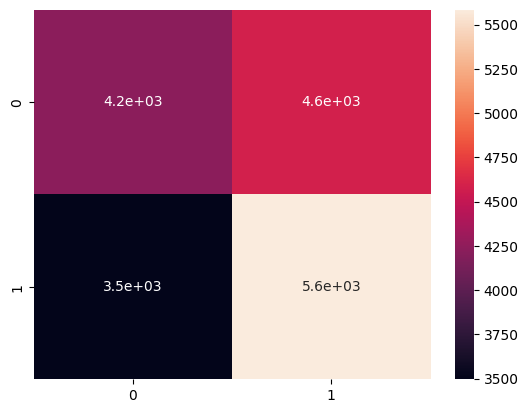

In [50]:
sns.heatmap(confusion_matrix_rf, annot=True)

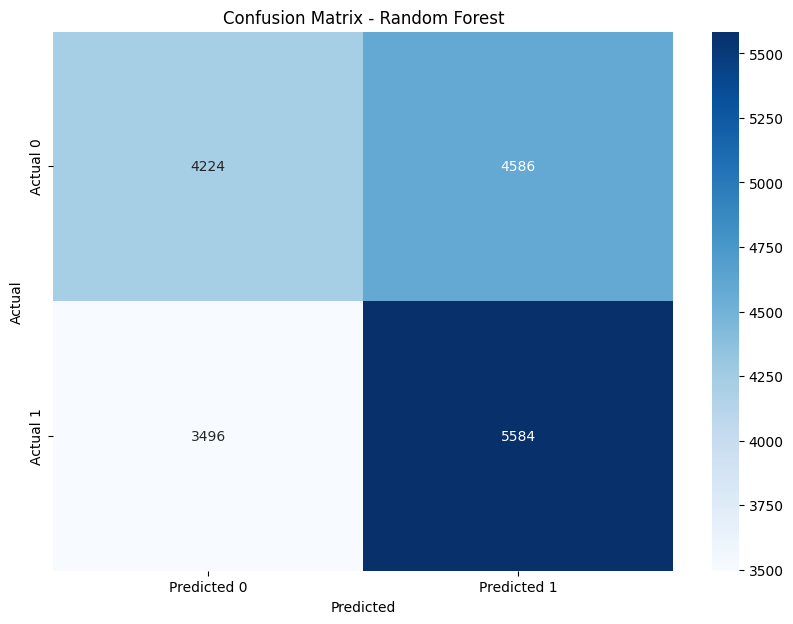

In [51]:
plt.figure(figsize=(10, 7)) 
sns.heatmap(confusion_matrix_rf, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted 0', 'Predicted 1'], yticklabels=['Actual 0', 'Actual 1']) 
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
plt.title('Confusion Matrix - Random Forest') 
plt.show()

**Apply Decision tree, and plot its ROC curve**

In [52]:
classifier_decision_tree = DecisionTreeClassifier(random_state=42) 
classifier_decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [53]:
y_pred_dt = classifier_decision_tree.predict(X_test) 
y_pred_prob_dt = classifier_decision_tree.predict_proba(X_test)[:, 1]

In [54]:
confusion_matrix_dt = confusion_matrix(y_test, y_pred_dt) 
class_report_dt = classification_report(y_test, y_pred_dt)

<Axes: >

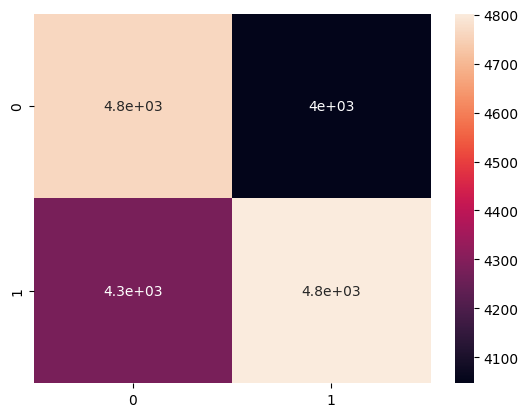

In [55]:
sns.heatmap(confusion_matrix_dt, annot=True)

In [56]:
print("Classification Report:\n", class_report_dt)

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.54      0.53      8810
           1       0.54      0.53      0.54      9080

    accuracy                           0.53     17890
   macro avg       0.53      0.53      0.53     17890
weighted avg       0.53      0.53      0.53     17890



In [57]:
# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test, y_pred_prob_dt) 
roc_auc = auc(fpr, tpr)

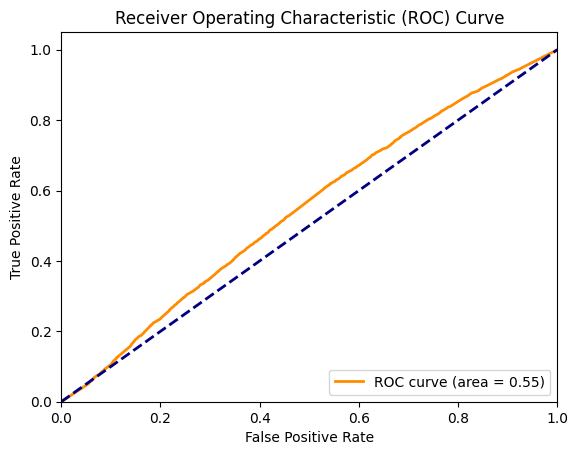

In [58]:
# Plot ROC curve 
plt.figure() 
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})') 
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--') 
plt.xlim([0.0, 1.0]) 
plt.ylim([0.0, 1.05]) 
plt.xlabel('False Positive Rate') 
plt.ylabel('True Positive Rate') 
plt.title('Receiver Operating Characteristic (ROC) Curve') 
plt.legend(loc="lower right") 
plt.show()

Model not performing

**Part2: unsupervised learning**

- Drop out the target variable
- Apply K means clustering and plot the clusters
- Find the optimal K parameter
- Interpret the results

In [59]:
df_unsupervised = df1.copy()
df_unsupervised.drop(columns=['HasDetections'], inplace=True)
df_unsupervised.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89447 entries, 0 to 89446
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Wdft_IsGamer                  89447 non-null  float64
 1   Census_IsVirtualDevice        89447 non-null  int64  
 2   Census_HasOpticalDiskDrive    89447 non-null  int64  
 3   Firewall                      89447 non-null  int64  
 4   SMode                         89447 non-null  int64  
 5   IsProtected                   89447 non-null  int64  
 6   CountryIdentifier             89447 non-null  int64  
 7   Census_OSEdition_numeric      89447 non-null  int64  
 8   OsPlatformSubRelease_numeric  89447 non-null  int64  
dtypes: float64(1), int64(8)
memory usage: 6.1 MB


In [60]:
# K-Mean Clustering :
kmeans = KMeans(n_clusters=5, random_state=42)
df_unsupervised['Cluster'] = kmeans.fit_predict(df_unsupervised)

In [61]:
# Evaluate the clusters
centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Print cluster centers
print("Cluster Centers:")
print(centers)

Cluster Centers:
[[2.86253552e-01 5.51384824e-03 8.48284345e-02 9.78665649e-01
  2.54485303e-04 9.50672265e-01 1.57377444e+02 5.20498791e+00
  3.48615176e+00]
 [2.92983809e-01 7.42097147e-03 7.19930609e-02 9.80098304e-01
  4.33693138e-04 9.63955281e-01 5.27134734e+01 5.15381650e+00
  3.47378566e+00]
 [2.76248832e-01 4.98494132e-03 8.72883996e-02 9.74971440e-01
  4.15411777e-04 9.43296292e-01 9.68238654e+01 5.53993146e+00
  3.55509399e+00]
 [3.14315200e-01 7.37136960e-03 6.77428866e-02 9.72431078e-01
  2.94854784e-04 9.57393484e-01 2.05091331e+02 5.67145806e+00
  3.53877340e+00]
 [2.79160566e-01 6.42589881e-03 7.71921262e-02 9.80640963e-01
  3.25361965e-04 9.63071417e-01 2.07256385e+01 5.45656418e+00
  3.52684236e+00]]


In [62]:
df_unsupervised.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89447 entries, 0 to 89446
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Wdft_IsGamer                  89447 non-null  float64
 1   Census_IsVirtualDevice        89447 non-null  int64  
 2   Census_HasOpticalDiskDrive    89447 non-null  int64  
 3   Firewall                      89447 non-null  int64  
 4   SMode                         89447 non-null  int64  
 5   IsProtected                   89447 non-null  int64  
 6   CountryIdentifier             89447 non-null  int64  
 7   Census_OSEdition_numeric      89447 non-null  int64  
 8   OsPlatformSubRelease_numeric  89447 non-null  int64  
 9   Cluster                       89447 non-null  int32  
dtypes: float64(1), int32(1), int64(8)
memory usage: 6.5 MB


C:\Users\Hp\AppData\Local\Temp\ipykernel_12644\1083986976.py:3: UserWarning:


The markers list has fewer values (3) than needed (5) and will cycle, which may produce an uninterpretable plot.



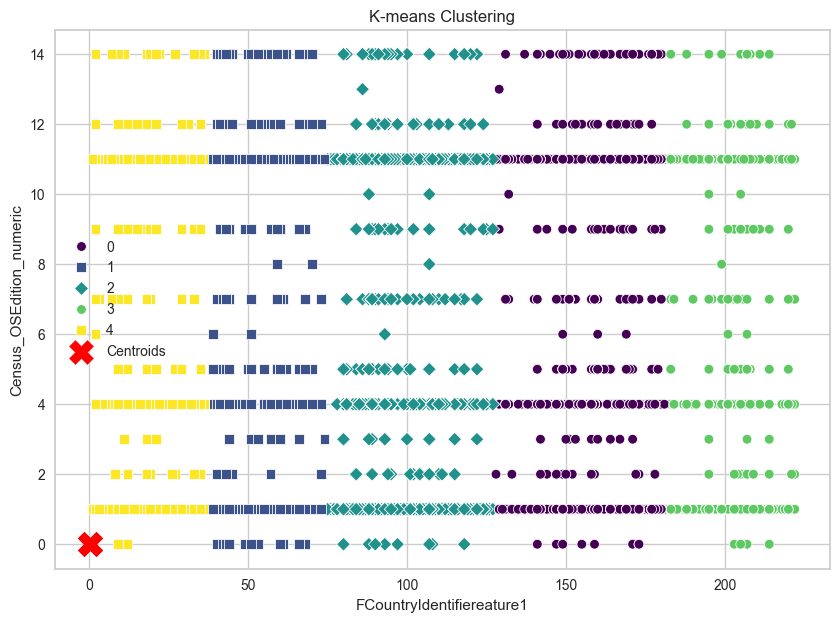

In [69]:
# Plot the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x='CountryIdentifier', y='Census_OSEdition_numeric', hue='Cluster', data=df_unsupervised, palette='viridis', style='Cluster', markers=['o', 's', 'D'])
plt.scatter(centers[:, 0], centers[:, 1], s=300, c='red', marker='X', label='Centroids')
plt.title('K-means Clustering')
plt.xlabel('FCountryIdentifiereature1')
plt.ylabel('Census_OSEdition_numeric')
plt.legend()
plt.show()

**Find the best K-mean : Elbow Method**

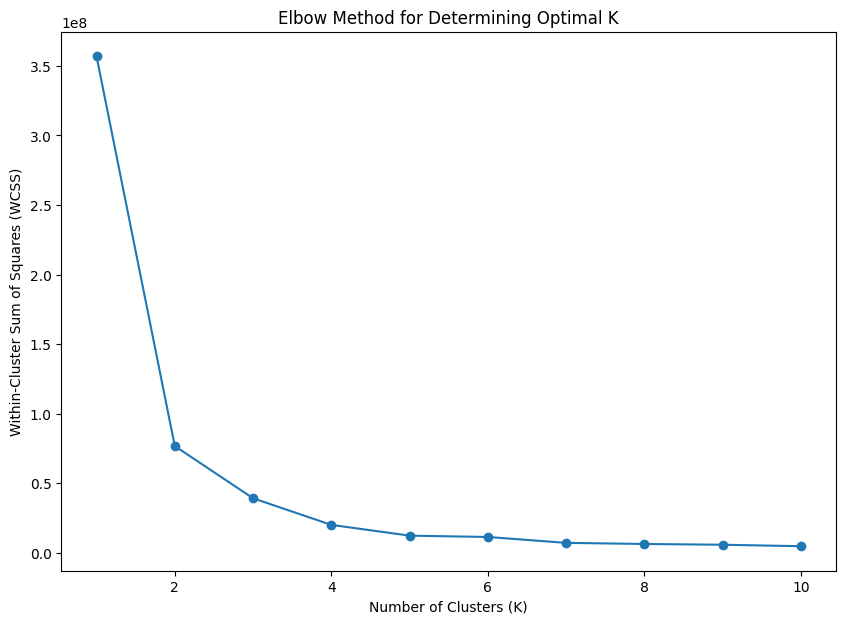

In [64]:
# Determine the optimal number of clusters using the Elbow Method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(df_unsupervised[['CountryIdentifier', 'Census_OSEdition_numeric']])
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method results
plt.figure(figsize=(10, 7))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method for Determining Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.show()

In [75]:
df_final = df_unsupervised.copy()

KElbowVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=20), k=20)

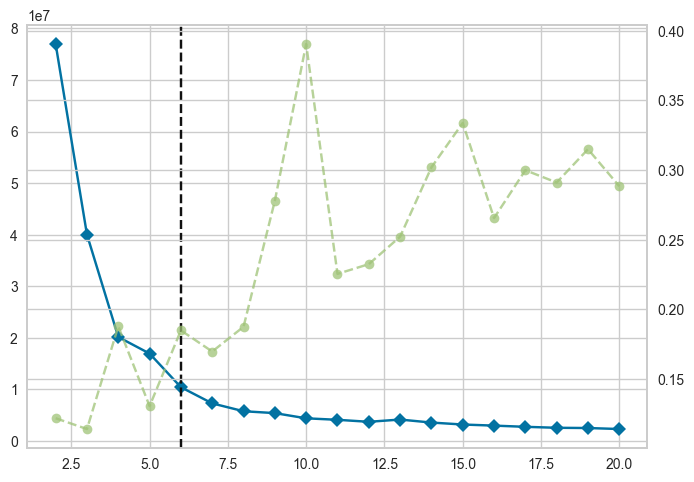

In [76]:
model_kmean = KMeans(n_clusters=20, algorithm='lloyd' )
best_k = KElbowVisualizer(model_kmean , k=20)
best_k.fit(df_final)

In [77]:
model_kmean = KMeans(n_clusters=5)
model_kmean.fit(df_final)

KMeans(n_clusters=5)

In [82]:
# Access the cluster labels 
labels = kmeans.labels_ 
# Add the labels to the DataFrame 
df_final['Cluster'] = labels
# Display the DataFrame with cluster labels 
print("DataFrame with Cluster Labels:") 
df_final

DataFrame with Cluster Labels:


,Wdft_IsGamer,Census_IsVirtualDevice,Census_HasOpticalDiskDrive,Firewall,SMode,IsProtected,CountryIdentifier,Census_OSEdition_numeric,OsPlatformSubRelease_numeric,Cluster
0,0.0,0,0,1,0,1,29,11,4,1
1,0.0,0,0,1,0,1,93,11,4,8
2,0.0,0,0,1,0,1,86,1,4,2
3,0.0,0,0,1,0,1,88,11,4,8
4,0.0,0,0,1,0,1,18,1,4,4
...,...,...,...,...,...,...,...,...,...,...
89442,0.0,0,0,1,0,1,177,11,3,7
89443,0.0,0,0,1,0,1,177,1,5,7
89444,0.0,0,1,1,0,1,206,11,4,3
89445,0.0,0,0,1,0,1,93,11,3,8
